### Import and configure modules

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools

In [2]:
import tensorflow as tf

from tensorflow.keras.preprocessing import image as kp_image
from tensorflow.python.keras import models
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

### Download Images

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### PLEASE TAKE YOUR OWN DIRECTORY NAME IN DRIVE. NO NEED TO TAKE DATASET. DATASET IMAGES IS TAKEN FROM INTERNET LINK ( WIKIPEDIA GALLERY )

In [71]:
IMG_DIR_NAME = '/content/drive/MyDrive/rohit/'

In [73]:
import os
img_dir = IMG_DIR_NAME
if not os.path.exists(img_dir):
    os.makedirs(img_dir)
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg

## Test images
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/thumb/6/61/20110425_German_Shepherd_Dog_8505.jpg/640px-20110425_German_Shepherd_Dog_8505.jpg
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/thumb/5/5b/Closed_up_of_a_sleeping_baby.jpg/640px-Closed_up_of_a_sleeping_baby.jpg
!wget --quiet -P /content/drive/MyDrive/rohit/ https://upload.wikimedia.org/wikipedia/commons/thumb/c/c8/Taj_Mahal_in_March_2004.jpg/640px-Taj_Mahal_in_March_2004.jpg



In [39]:
# from io import BytesIO
# import requests
# from PIL import Image
# train1 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg').content))
# train2 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg').content))
# train3 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg').content))
# train4 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg').content))
# train5 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg').content))

# #test images
# test1 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/thumb/6/61/20110425_German_Shepherd_Dog_8505.jpg/640px-20110425_German_Shepherd_Dog_8505.jpg').content))
# test2 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/thumb/5/5b/Closed_up_of_a_sleeping_baby.jpg/640px-Closed_up_of_a_sleeping_baby.jpg').content))
# test3 = Image.open(BytesIO(requests.get('https://upload.wikimedia.org/wikipedia/commons/thumb/c/c8/Taj_Mahal_in_March_2004.jpg/640px-Taj_Mahal_in_March_2004.jpg').content))




In [74]:
def load_img(path_to_img):
  max_dim = 512
  img = Image.open(path_to_img)
  long = max(img.size)
  scale = max_dim/long
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)

  img = kp_image.img_to_array(img)

  # We need to broadcast the image array such that it has a batch dimension
  img = np.expand_dims(img, axis=0)
  return img

In [75]:
def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)

In [76]:
# Set up some global values here
content_path = '/content/drive/MyDrive/rohit/640px-Taj_Mahal_in_March_2004.jpg'
style_path = '/content/drive/MyDrive/rohit/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg'

<ipython-input-74-6bec5843712d>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


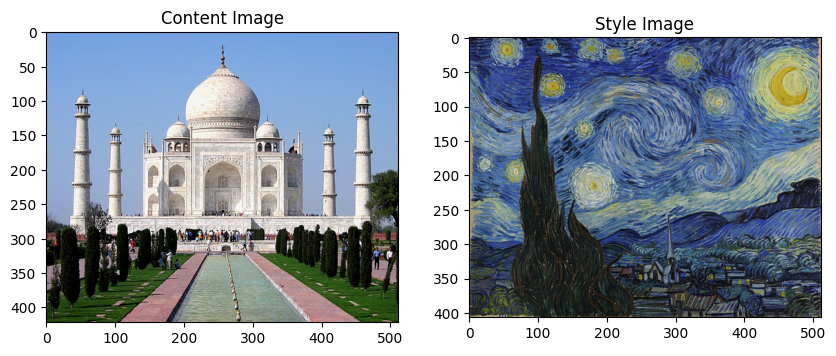

In [77]:
plt.figure(figsize=(10,10))

content = load_img(content_path).astype('uint8')
style = load_img(style_path).astype('uint8')

plt.subplot(1, 2, 1)
imshow(content, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.show()

## Prepare the data
Let's create methods that will allow us to load and preprocess our images easily. We perform the same preprocessing process as are expected according to the VGG training process. VGG networks are trained on image with each channel normalized by `mean = [103.939, 116.779, 123.68]`and with channels BGR.

In [78]:
def load_and_process_img(path_to_img):
  img = load_img(path_to_img)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

In order to view the outputs of our optimization, we are required to perform the inverse preprocessing step. Furthermore, since our optimized image may take its values anywhere between $- \infty$ and $\infty$, we must clip to maintain our values from within the 0-255 range.   

In [79]:
def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")

  # perform the inverse of the preprocessiing step
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

### Define content and style representations
These intermediate layers are necessary to define the representation of content and style from our images.


In [80]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2']

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

## Build the Model
In this case, we load VGG19, and feed in our input tensor to the model. This will allow us to extract the feature maps (and subsequently the content and style representations) of the content, style, and generated images.

We use VGG19, as suggested in the paper. In addition, since VGG19 is a relatively simple model  the feature maps actually work better for style transfer. we will just ignore the later part of the model. by using (include_top = false)  

In order to access the intermediate layers corresponding to our style and content feature maps, we get the corresponding outputs and using the Keras Functional API, we define our model with the desired output activations.

With the Functional API defining a model simply involves defining the input and output:

model = Model(inputs, outputs)

<ipython-input-74-6bec5843712d>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


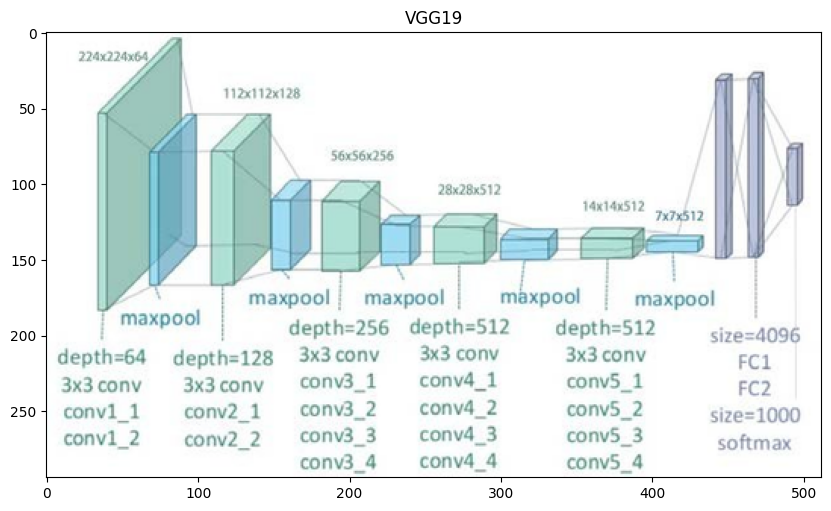

In [81]:
img = load_img("/content/vgg19.png").astype('uint8')
imshow(img,"VGG19")

  
  This function will load the VGG19 model and access the intermediate layers.
  These layers will then be used to create a new model that will take input image
  and return the outputs from these intermediate layers from the VGG model.
  
  Returns:
    returns a keras model that takes image inputs and outputs the style and
      content intermediate layers.


In [82]:
def get_model():
  # Load our model. We load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Get output layers corresponding to style and content layers
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model
  return models.Model(vgg.input, model_outputs)

In the above code snippet, we’ll load our pretrained image classification network. Then we grab the layers of interest as we defined earlier. Then we define a Model by setting the model’s inputs to an image and the outputs to the outputs of the style and content layers. In other words, we created a model that will take an input image and output the content and style intermediate layers!


### Content Loss

Our content loss definition is actually quite simple. We’ll pass the network both the desired content image and our base input image. This will return the intermediate layer outputs (from the layers defined above) from our model. Then we simply take the euclidean distance between the two intermediate representations of those images.  

We perform backpropagation in the usual way such that we minimize this content loss. We thus change the initial image until it generates a similar response in a certain layer (defined in content_layer) as the original content image.

This can be implemented quite simply. Again it will take as input the feature maps at a layer L in a network fed by x, our input image, and p, our content image, and return the content distance.



In [83]:
# Computing content lso
def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

## Style Loss

Computing style loss is a bit more involved, but follows the same principle, this time feeding our network the base input image and the style image. However, instead of comparing the raw intermediate outputs of the base input image and the style image, we instead compare the Gram matrices of the two outputs.


In [84]:
# Computing style loss

def gram_matrix(input_tensor):
  # We make the image channels first
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  """Expects two images of dimension h, w, c"""
  # height, width, num filters of each layer
  # We scale the loss at a given layer by the size of the feature map and the number of filters
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)

  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

## Apply style transfer to our images



In this case, we use the [Adam] optimizer in order to minimize our loss. We iteratively update our output image such that it minimizes our loss: we don't update the weights associated with our network, but instead we train our input image to minimize loss. In order to do this, we must know how we calculate our loss and gradients.


We’ll define a little helper function that will load our content and style image, feed them forward through our network, which will then output the content and style feature representations from our model.

  Helper function to compute our content and style feature representations.

  This function will simply load and preprocess both the content and style
  images from their path. Then it will feed them through the network to obtain
  the outputs of the intermediate layers.
  
  Arguments:
    model: The model that we are using.
    content_path: The path to the content image.
    style_path: The path to the style image
    
  Returns:
    returns the style features and the content features.


In [85]:
def get_feature_representations(model, content_path, style_path):
  # Load our images in
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)

  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)


  # Get the style and content feature representations from our model
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

This function will compute the loss total loss.
  
  Arguments:
    model: The model that will give us access to the intermediate layers
    loss_weights: The weights of each contribution of each loss function.
      (style weight, content weight, and total variation weight)
    init_image: Our initial base image. This image is what we are updating with
      our optimization process. We apply the gradients wrt the loss we are
      calculating to this image.
    gram_style_features: Precomputed gram matrices corresponding to the
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of
      interest.
      
  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  

In [86]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  style_weight, content_weight = loss_weights

  # Feed our init image through our model. This will give us the content and
  # style representations at our desired layers. Since we're using eager
  # our model is callable just like any other function!
  model_outputs = model(init_image)

  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]

  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)

  # Accumulate content losses from all layers
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)

  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score
  return loss, style_score, content_score

Then computing the gradients is easy:

In [87]:
def compute_grads(cfg):
  with tf.GradientTape() as tape:
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

### Optimization loop

In [88]:
import IPython.display

def run_style_transfer(content_path,
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3,
                       style_weight=1e-2):
  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false.
  model = get_model()
  for layer in model.layers:
    layer.trainable = False

  # Get the style and content feature representations (from our specified intermediate layers)
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

  # Set initial image
  init_image = load_and_process_img(content_path)
  init_image = tf.Variable(init_image, dtype=tf.float32)
  # Create our optimizer
  opt = tf.keras.optimizers.Adam(learning_rate=5e-1, beta_1=0.99, epsilon=1e-1)


  # For displaying intermediate images
  iter_count = 1

  # Store our best result
  best_loss, best_img = float('inf'), None

  # Create a nice config
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }

  # For displaying
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()

  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means

  imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time()

    if loss < best_loss:
      # Update best loss and best image from total loss.
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      start_time = time.time()

      # Use the .numpy() method to get the concrete numpy array
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      imgs.append(plot_img)
      # IPython.display.clear_output(wait=True)
      IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))
      print('Total loss: {:.4e}, '
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  # IPython.display.clear_output(wait=True)
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])

  return best_img, best_loss

<ipython-input-74-6bec5843712d>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


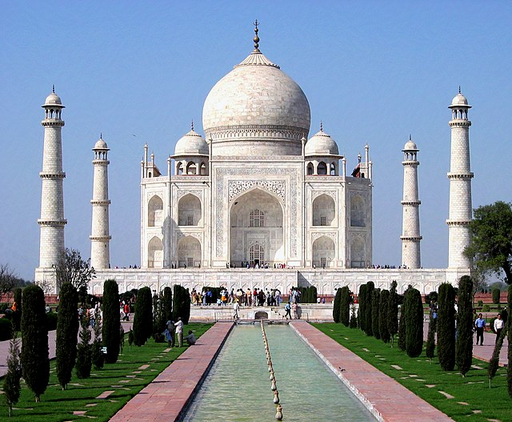

Iteration: 0
Total loss: 2.3855e+08, style loss: 2.3855e+08, content loss: 0.0000e+00, time: 0.0920s


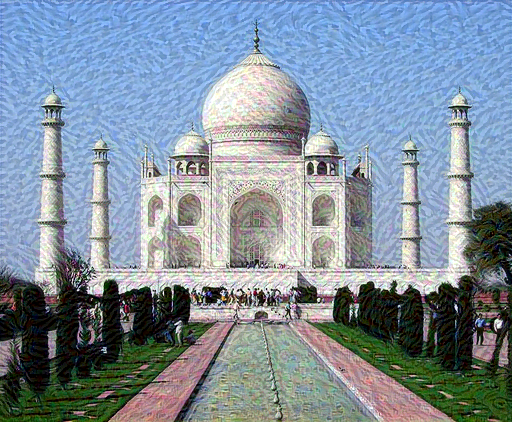

Iteration: 80
Total loss: 1.4137e+07, style loss: 9.7077e+06, content loss: 4.4295e+06, time: 0.0928s


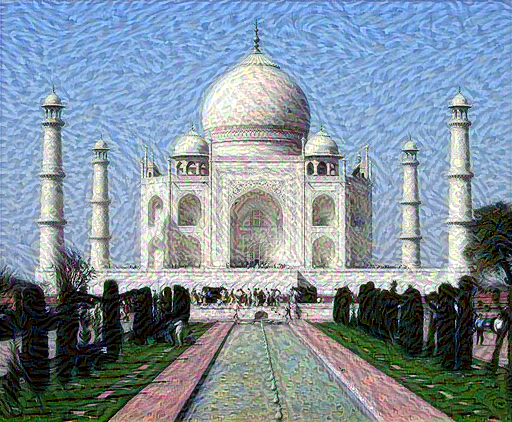

Iteration: 160
Total loss: 8.3445e+06, style loss: 4.6102e+06, content loss: 3.7343e+06, time: 0.0883s


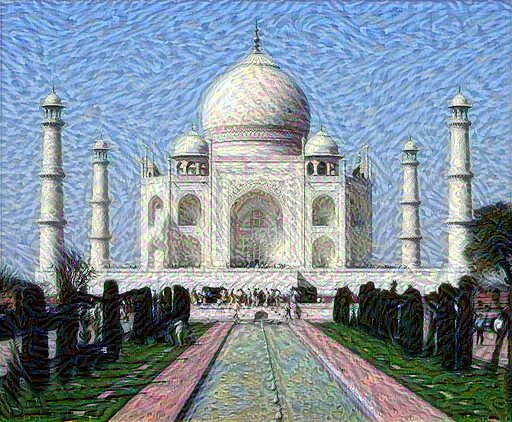

Iteration: 240
Total loss: 6.0179e+06, style loss: 2.9666e+06, content loss: 3.0513e+06, time: 0.0625s


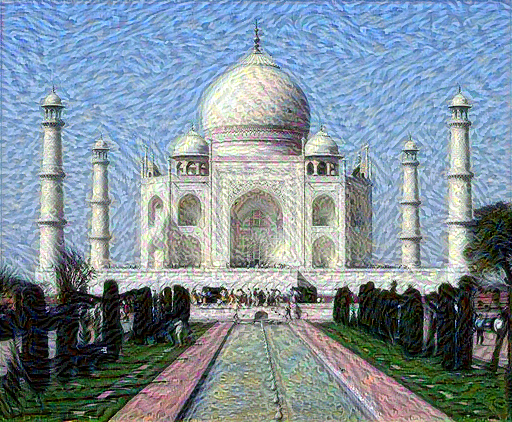

Iteration: 320
Total loss: 4.7835e+06, style loss: 2.2571e+06, content loss: 2.5265e+06, time: 0.0643s


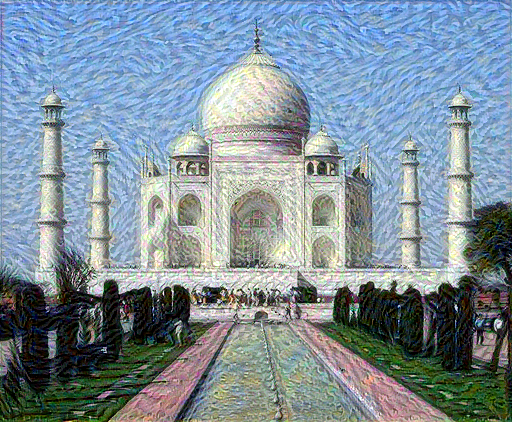

Iteration: 400
Total loss: 4.0034e+06, style loss: 1.8204e+06, content loss: 2.1830e+06, time: 0.0655s


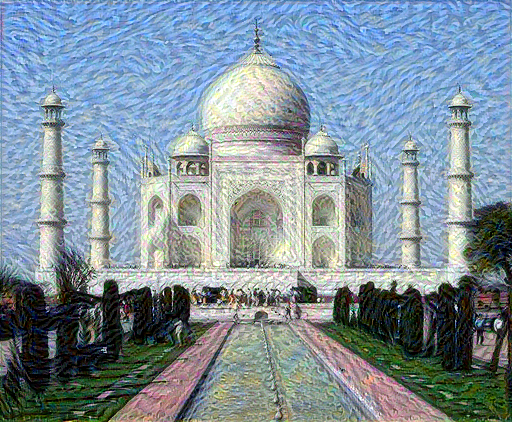

Iteration: 480
Total loss: 3.4791e+06, style loss: 1.5525e+06, content loss: 1.9266e+06, time: 0.0853s


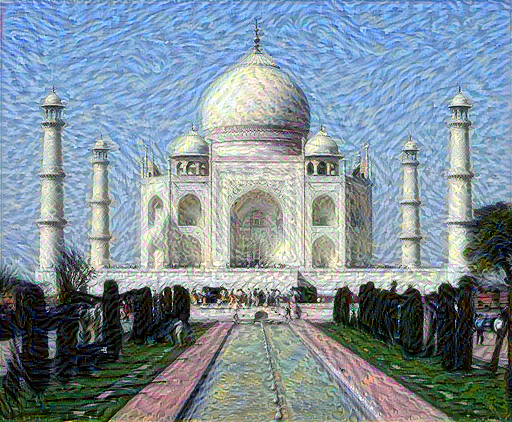

Iteration: 560
Total loss: 3.1030e+06, style loss: 1.3607e+06, content loss: 1.7423e+06, time: 0.0916s


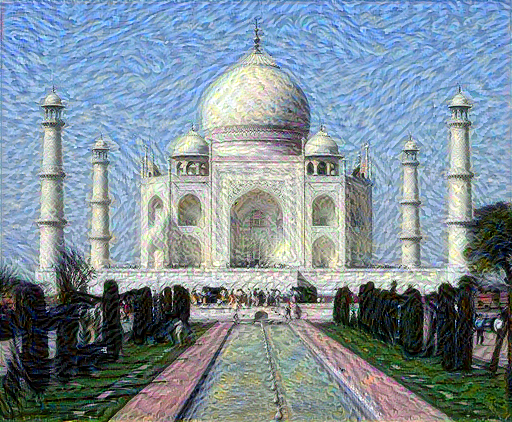

Iteration: 640
Total loss: 2.8231e+06, style loss: 1.2218e+06, content loss: 1.6013e+06, time: 0.0683s


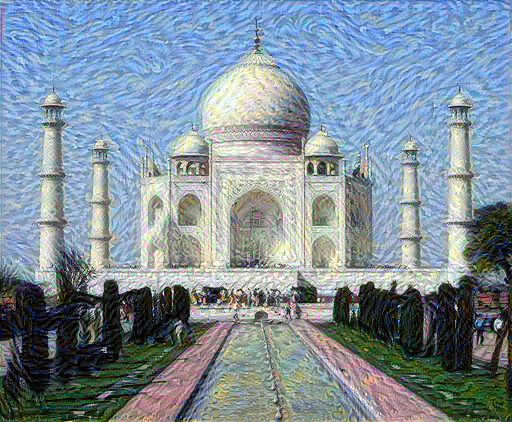

Iteration: 720
Total loss: 2.6086e+06, style loss: 1.1165e+06, content loss: 1.4920e+06, time: 0.0640s
Total time: 121.7178s


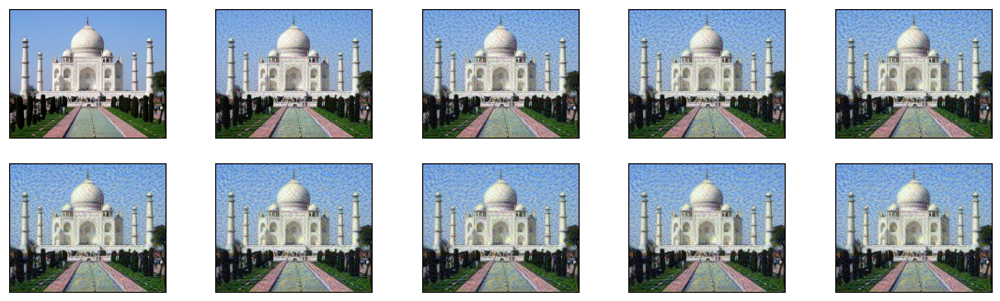

In [89]:
best, best_loss = run_style_transfer(content_path,
                                     style_path, num_iterations=800)

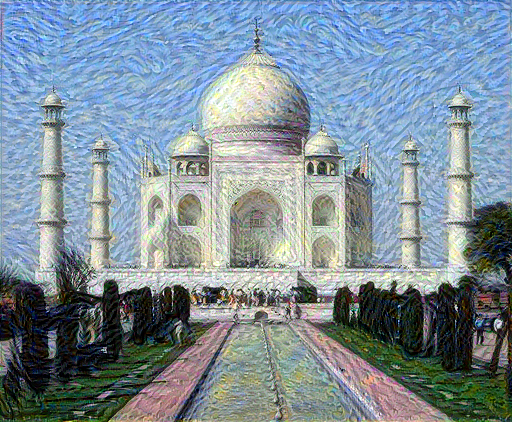

In [90]:
Image.fromarray(best)

## Visualize outputs
We "deprocess" the output image in order to remove the processing that was applied to it.

In [91]:
def show_results(best_img, content_path, style_path, show_large_final=True):
  plt.figure(figsize=(10, 5))
  content = load_img(content_path)
  style = load_img(style_path)

  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')

  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')

  if show_large_final:
    plt.figure(figsize=(10, 10))

    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()

<ipython-input-74-6bec5843712d>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


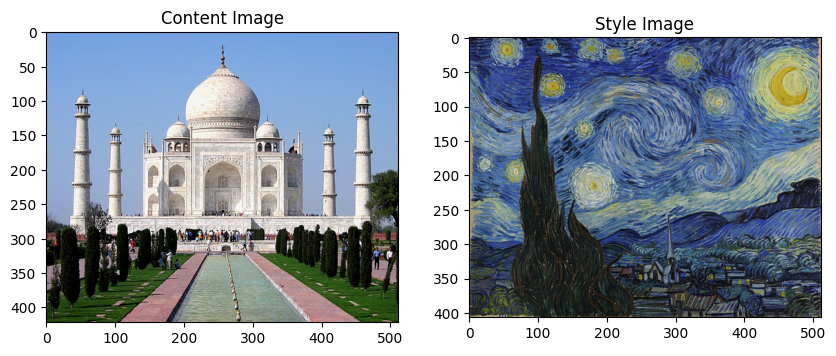

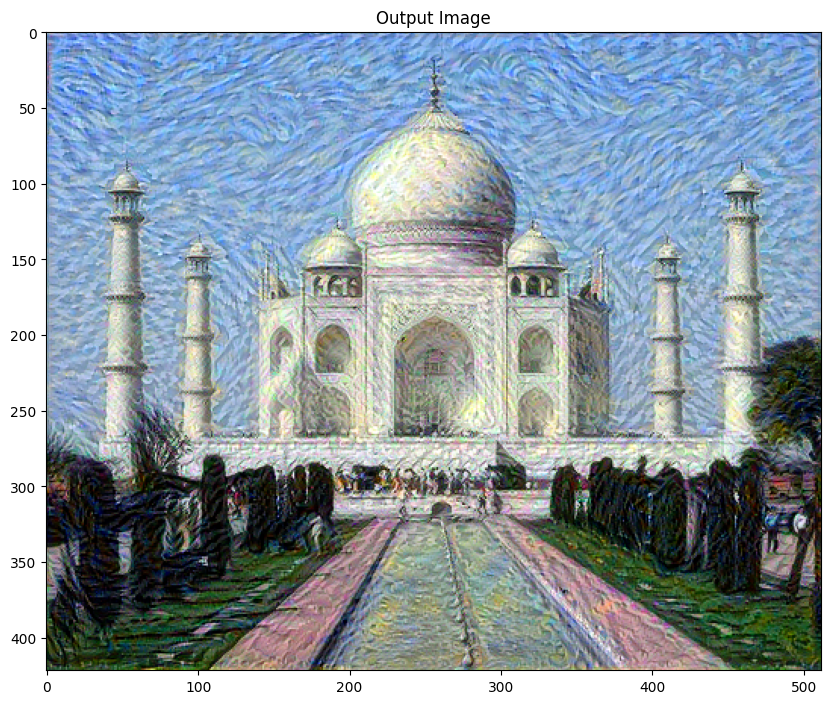

In [92]:
show_results(best, content_path, style_path)

### pillar of creation + sleeping baby

NOW WE CAN GIVE INPUT IMAGES, AND IT WILL GIVE OUTPUTS

<ipython-input-74-6bec5843712d>:6: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)


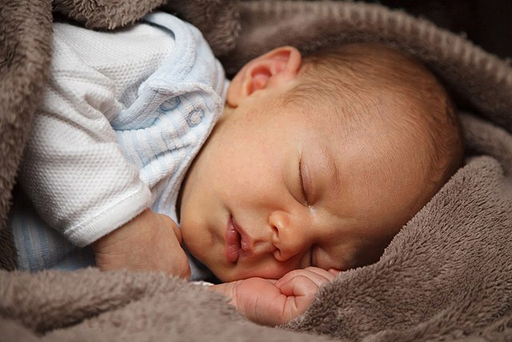

Iteration: 0
Total loss: 4.9888e+07, style loss: 4.9888e+07, content loss: 0.0000e+00, time: 0.0880s


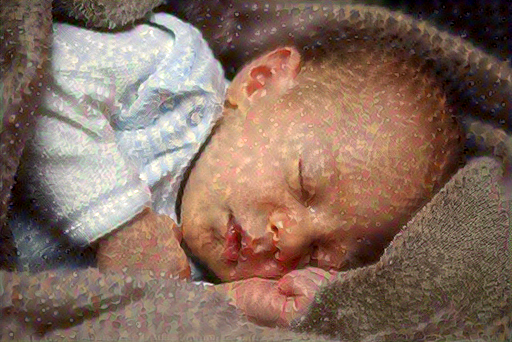

Iteration: 100
Total loss: 3.4910e+06, style loss: 2.3498e+06, content loss: 1.1411e+06, time: 0.0610s


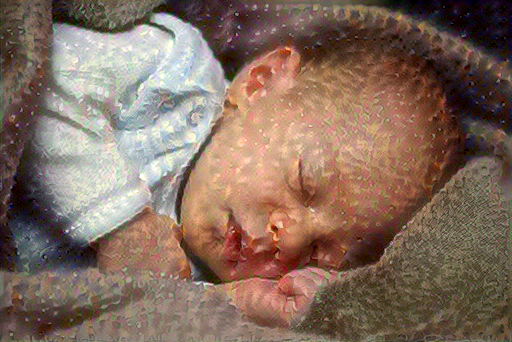

Iteration: 200
Total loss: 2.0744e+06, style loss: 1.1812e+06, content loss: 8.9320e+05, time: 0.0557s


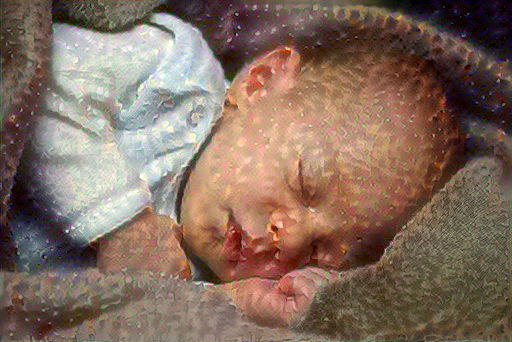

Iteration: 300
Total loss: 1.4694e+06, style loss: 7.4691e+05, content loss: 7.2247e+05, time: 0.0551s


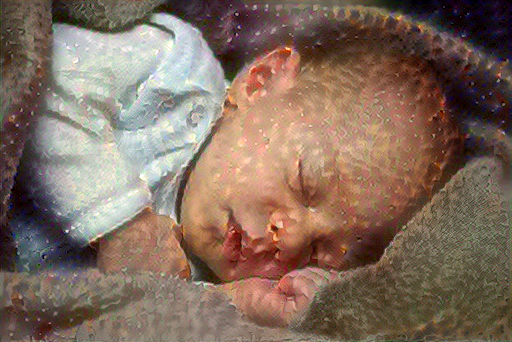

Iteration: 400
Total loss: 1.1605e+06, style loss: 5.4779e+05, content loss: 6.1270e+05, time: 0.0723s


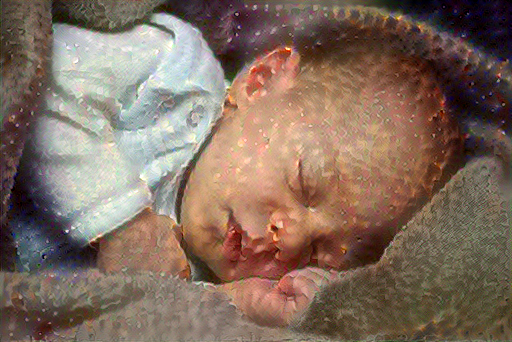

Iteration: 500
Total loss: 9.8567e+05, style loss: 4.4084e+05, content loss: 5.4484e+05, time: 0.0810s


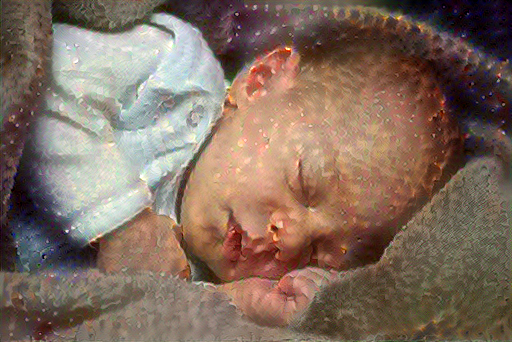

Iteration: 600
Total loss: 8.7696e+05, style loss: 3.8130e+05, content loss: 4.9566e+05, time: 0.0718s


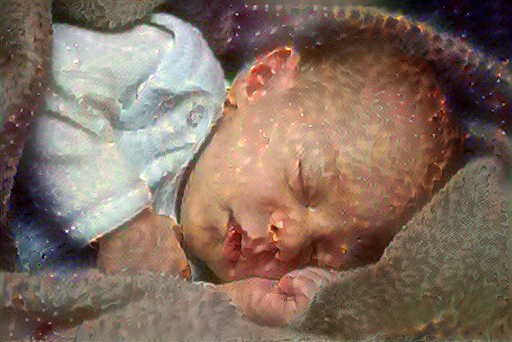

Iteration: 700
Total loss: 8.0391e+05, style loss: 3.4111e+05, content loss: 4.6281e+05, time: 0.0538s


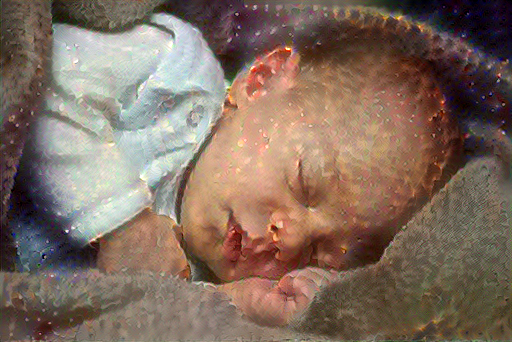

Iteration: 800
Total loss: 7.5092e+05, style loss: 3.1256e+05, content loss: 4.3836e+05, time: 0.0563s


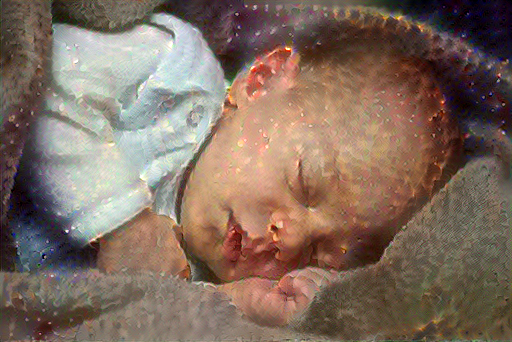

Iteration: 900
Total loss: 7.1097e+05, style loss: 2.9093e+05, content loss: 4.2004e+05, time: 0.0566s
Total time: 129.1059s


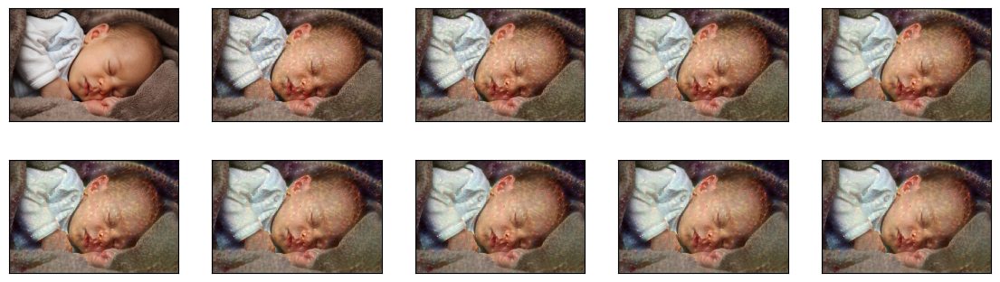

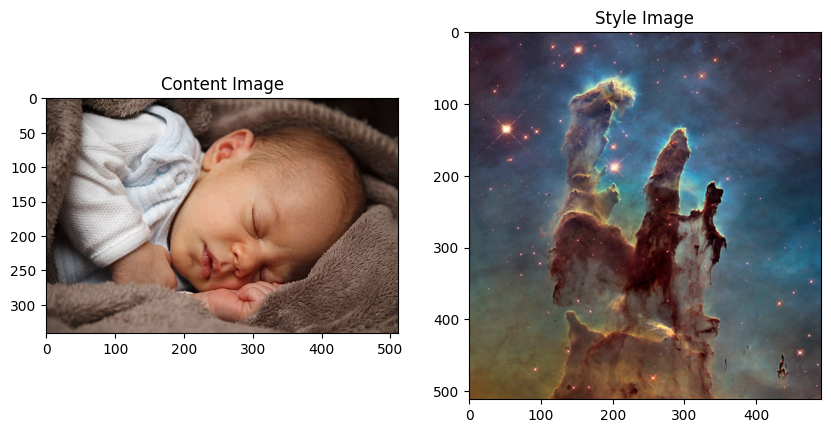

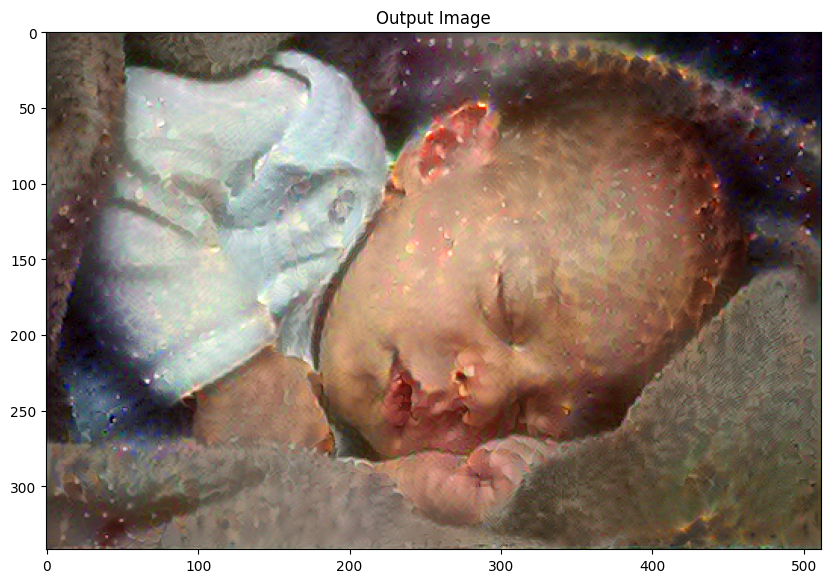

In [93]:
content_img = '/content/drive/MyDrive/rohit/640px-Closed_up_of_a_sleeping_baby.jpg'
style_img = '/content/drive/MyDrive/rohit/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg'

output, loss = run_style_transfer(content_img, style_img)
show_results(output, content_img, style_img)

# **LIMITATIONS AND IMPROVEMENTS**

The model is  trained on a specific style and is fixed for that style. Adapting the model to new styles may require retraining.

We can train this on a large dataset COCO 2014 but it is large dataset so I decided to follow this approach.

this style transfer methods can over-smooth regions, impacting the overall quality of the transferred image.

I have used ADAM optimizer , to get better results we can use L-BFGS optimizer.

We have limited control over the output of the style transfer process. Fine-tuning the result according to our preferences can be challenging.

For advancements :

We can make real time style transfer( video clips)

Use better architecture than VGG19. ( time will be compromised)

Integration of style transfer with generative models like GANs (Generative Adversarial Networks) for more realistic and diverse image synthesis.

Exploration of neural architecture search techniques to automatically discover architectures optimized for style transfer tasks.

Techniques that consider semantic information to improve the content preservation aspect of style transfer.


